# Final Project Notebook 8 - Word Embedding 2

## Metadata

```

MacKenzye Leroy (zuf9mc@vriginia.edu)
DS 5001
2 May 2022

Purpose:  This notebook cuses word2vec on each individual author
Note: Much of the code in the notebook was originally witten by Dr. Rafael Alvarado and has been editted to fit my particular problem 
```

# Set Up

In [1]:
import pandas as pd
import numpy as np
from gensim.models import word2vec
from sklearn.manifold import TSNE
from scipy.linalg import norm


In [2]:
import plotly.express as px
import seaborn as sns; sns.set()
import os

In [3]:
norm_docs = True # L2 norming
center_by_mean = True 
n_terms = 1000 # Number of significant words; feature space
k = 6 # Number of components

In [4]:
#os.chdir('/Users/mackenzyeleroy/Documents/MSDS/DS5001/FinalProject')
home_dir = os.getcwd()
home_dir

'/Users/mackenzyeleroy/Documents/MSDS/DS5001/ETA-Final-Project/FinalProject'

In [5]:
data_home = f"{home_dir}/Data"
parser_lib = f"{home_dir}/lib"
source_files = f'{data_home}/output'
data_prefix = 'wells-verne'

In [6]:
OHCO = ['book_id','chap_id','para_num','sent_num','token_num']

In [7]:
Wells_w2v_params = dict(
    min_count = 50,
    #workers = 4,
    vector_size = 256,
    window = 2    
)

In [8]:
Verne_w2v_params = dict(
    min_count = 50,
    #workers = 4,
    vector_size = 256,
    window = 2    
)

In [9]:
tsne_params = dict(
    learning_rate = 200., #'auto' or [10.0, 1000.0]
    perplexity = 20,
    n_components = 2,
    init = 'random',
    n_iter = 1000,
    random_state = 42    
)

# Get Data

In [10]:
TOKENS = pd.read_csv(f"{source_files}/{data_prefix}-CORPUS.csv").set_index(OHCO)

In [11]:
TOKENS.head()

pos_tuple  pos  \
book_id chap_id para_num sent_num token_num                                
35      1       0        0        0          ('Introduction', 'NN')   NN   
                1        0        0                   ('The', 'DT')   DT   
                                  1                 ('Time', 'NNP')  NNP   
                                  2            ('Traveller', 'NNP')  NNP   
                                  3                 ('(for', 'NNP')  NNP   

                                                token_str      term_str  
book_id chap_id para_num sent_num token_num                              
35      1       0        0        0          Introduction  introduction  
                1        0        0                   The           the  
                                  1                  Time          time  
                                  2             Traveller     traveller  
                                  3                  (for           for

In [12]:
#need to seperate our CORPUS by auther ussing Gutenburg id numbers
WellsCORPUSNum = [780, 718, 6424, 5230, 36, 35, 159, 12163, 1059, 1013]
VerneCORPUSNum = [44278, 3526, 3091, 18857, 16457, 164, 1355, 1353, 1268, 103]

In [13]:
TOKENS = TOKENS.reset_index()
WellsTOKENS = TOKENS[TOKENS.book_id.isin(WellsCORPUSNum)]
VerneTOKENS = TOKENS[TOKENS.book_id.isin(VerneCORPUSNum)]
WellsTOKENS = WellsTOKENS.set_index(OHCO)
VerneTOKENS = VerneTOKENS.set_index(OHCO)
TOKENS = TOKENS.set_index(OHCO)
WellsTOKENS

pos_tuple  pos  \
book_id chap_id para_num sent_num token_num                                
35      1       0        0        0          ('Introduction', 'NN')   NN   
                1        0        0                   ('The', 'DT')   DT   
                                  1                 ('Time', 'NNP')  NNP   
                                  2            ('Traveller', 'NNP')  NNP   
                                  3                 ('(for', 'NNP')  NNP   
...                                                             ...  ...   
12163   25      45       0        14                 ('was', 'VBD')  VBD   
                                  15                 ('very', 'RB')   RB   
                                  16                ('near.', 'JJ')   JJ   
                46       0        0                   ('THE', 'DT')   DT   
                                  1                 ('END.', 'NNP')  NNP   

                                                token_str      term_str  
book_id chap_id para_num sent_num token_num                              
35      1       0        0        0          Introduction  introduction  
                1        0        0                   The           the  
                                  1                  Time          time  
                                  2             Traveller     traveller  
                                  3                  (for           for  
...                                                   ...           ...  
12163   25      45       0        14                  was           was  
                                  15                 very          very  
                                  16                near.          near  
                46       0        0                   THE           the  
                                  1                  END.           end  

[861960 rows x 4 columns]

In [14]:
VerneTOKENS 

pos_tuple  pos  \
book_id chap_id para_num sent_num token_num                            
103     1       0        0        0               ('IN', 'NNP')  NNP   
                                  1            ('WHICH', 'NNP')  NNP   
                                  2          ('PHILEAS', 'NNP')  NNP   
                                  3             ('FOGG', 'NNP')  NNP   
                                  4              ('AND', 'NNP')  NNP   
...                                                         ...  ...   
44278   28      15       1        14             ('will', 'MD')   MD   
                                  15             ('come', 'VB')   VB   
                                  16              ('out', 'RP')   RP   
                                  17              ('all', 'DT')   DT   
                                  18          ('right."', 'NN')   NN   

                                            token_str term_str  
book_id chap_id para_num sent_num token_num                     
103     1       0        0        0                IN       in  
                                  1             WHICH    which  
                                  2           PHILEAS  phileas  
                                  3              FOGG     fogg  
                                  4               AND      and  
...                                               ...      ...  
44278   28      15       1        14             will     will  
                                  15             come     come  
                                  16              out      out  
                                  17              all      all  
                                  18          right."    right  

[914683 rows x 4 columns]

In [15]:
len(TOKENS) == len(WellsTOKENS) + len(VerneTOKENS)

True

# Extract VOCAB

Use this to filter significant terms and to store w2v features and tSNE coordinates.

In [16]:
WellsVOCAB = WellsTOKENS.term_str.value_counts().to_frame('n')
WellsVOCAB.index.name = 'term_str'

In [17]:
WellsVOCAB['pos_max'] = WellsTOKENS.value_counts(['term_str','pos']).unstack().idxmax(1)

In [18]:
WellsVOCAB['pos_group'] = WellsVOCAB.pos_max.str.slice(0,2)

## Verne

In [19]:
VerneVOCAB = VerneTOKENS.term_str.value_counts().to_frame('n')
VerneVOCAB.index.name = 'term_str'

In [20]:
VerneVOCAB['pos_max'] = VerneTOKENS.value_counts(['term_str','pos']).unstack().idxmax(1)

In [21]:
VerneVOCAB['pos_group'] = VerneVOCAB.pos_max.str.slice(0,2)

# Add Chapter Significance

In [22]:
WellsCHAPS = WellsTOKENS.groupby(OHCO[:2]+['term_str']).term_str.count()\
    .unstack(fill_value=0).astype('bool').astype('int')

In [23]:
WellsCHAPS.head()

term_str         1  10  1000  10000000  101  105  107  11  12  140000000  ...  \
book_id chap_id                                                           ...   
35      1        0   0     0         0    0    0    0   0   0          0  ...   
        2        0   0     0         0    0    0    0   0   0          0  ...   
        3        0   0     0         0    0    0    0   0   0          0  ...   
        4        0   0     0         0    0    0    0   0   0          0  ...   
        5        0   0     0         0    0    0    0   0   0          0  ...   

term_str         à  â  âtrice  æsthetic  æstheticism  éclat  épicier  ō  α  β  
book_id chap_id                                                                
35      1        0  0       0         0            0      0        0  0  0  0  
        2        0  0       0         0            0      0        0  0  0  0  
        3        0  0       0         0            0      0        0  0  0  0  
        4        0  0       0         0            0      0        0  0  0  0  
        5        0  0       0         0            0      0        0  0  0  0  

[5 rows x 28510 columns]

In [24]:
WellsVOCAB['df'] = WellsCHAPS.sum()
WellsVOCAB['dfidf'] = WellsVOCAB.df * np.log2(len(WellsCHAPS)/WellsVOCAB.df)

In [25]:
WellsVOCAB.sort_values('dfidf', ascending=False)

,n,pos_max,pos_group,df,dfidf
term_str,,,,,
started,110,VBD,VB,69,99.24753
moving,118,VBG,VB,69,99.24753
drew,128,VBD,VB,69,99.24753
mouth,136,NN,NN,69,99.24753
beneath,138,IN,IN,69,99.24753
...,...,...,...,...,...
in,14522,IN,IN,187,0.00000
to,19581,TO,TO,187,0.00000
a,22780,DT,DT,187,0.00000


## Verne

In [26]:
VerneCHAPS = VerneTOKENS.groupby(OHCO[:2]+['term_str']).term_str.count()\
    .unstack(fill_value=0).astype('bool').astype('int')

In [27]:
VerneCHAPS.head()

term_str         0  000436  016  05  092  0h  1  10  100  1000  ...  \
book_id chap_id                                                 ...   
103     1        0       0    0   0    0   0  0   0    0     0  ...   
        2        0       0    0   0    0   0  0   0    0     0  ...   
        3        0       0    0   0    0   0  0   0    0     0  ...   
        4        0       0    0   0    0   0  0   0    0     0  ...   
        5        0       0    0   0    0   0  0   0    0     0  ...   

term_str         zoroasterthe  zostera  zouave  zouricolo  zqq  zulma  \
book_id chap_id                                                         
103     1                   0        0       0          0    0      0   
        2                   0        0       0          0    0      0   
        3                   0        0       0          0    0      0   
        4                   0        0       0          0    0      0   
        5                   0        0       0          0    0      0   

term_str         zungomoro  zvdk  à  œdipus  
book_id chap_id                              
103     1                0     0  0       0  
        2                0     0  0       0  
        3                0     0  0       0  
        4                0     0  0       0  
        5                0     0  0       0  

[5 rows x 26359 columns]

In [28]:
VerneVOCAB['df'] = VerneCHAPS.sum()
VerneVOCAB['dfidf'] = VerneVOCAB.df * np.log2(len(VerneCHAPS)/VerneVOCAB.df)

In [29]:
VerneVOCAB.sort_values('dfidf', ascending=False)

,n,pos_max,pos_group,df,dfidf
term_str,,,,,
below,231,IN,IN,142,205.394854
south,275,NN,NN,142,205.394854
reason,219,NN,NN,142,205.394854
got,217,VBD,VB,143,205.393534
according,197,VBG,VB,143,205.393534
...,...,...,...,...,...
in,14483,IN,IN,387,0.000000
a,18472,DT,DT,387,0.000000
and,23300,CC,CC,387,0.000000


# Get List of Token Lists

For Gensim

In [30]:
WellsSENTS = WellsTOKENS.groupby(OHCO[:-1]).term_str.apply(lambda  x:  x.tolist())

In [31]:
VerneSENTS = VerneTOKENS.groupby(OHCO[:-1]).term_str.apply(lambda  x:  x.tolist())

# Learn Word Embeddings

In [32]:
WellsSENTS.head().tolist()

[['introduction'],
 ['the',
  'time',
  'traveller',
  'for',
  'so',
  'it',
  'will',
  'be',
  'convenient',
  'to',
  'speak',
  'of',
  'him',
  'was',
  'expounding',
  'a',
  'recondite',
  'matter',
  'to',
  'us'],
 ['his',
  'pale',
  'grey',
  'eyes',
  'shone',
  'and',
  'twinkled',
  'and',
  'his',
  'usually',
  'pale',
  'face',
  'was',
  'flushed',
  'and',
  'animated'],
 ['the',
  'fire',
  'burnt',
  'brightly',
  'and',
  'the',
  'soft',
  'radiance',
  'of',
  'the',
  'incandescent',
  'lights',
  'in',
  'the',
  'lilies',
  'of',
  'silver',
  'caught',
  'the',
  'bubbles',
  'that',
  'flashed',
  'and',
  'passed',
  'in',
  'our',
  'glasses'],
 ['our',
  'chairs',
  'being',
  'his',
  'patents',
  'embraced',
  'and',
  'caressed',
  'us',
  'rather',
  'than',
  'submitted',
  'to',
  'be',
  'sat',
  'upon',
  'and',
  'there',
  'was',
  'that',
  'luxurious',
  'after',
  'dinner',
  'atmosphere',
  'when',
  'thought',
  'runs',
  'gracefully',
  

In [33]:
VerneSENTS.head().tolist()

[['in',
  'which',
  'phileas',
  'fogg',
  'and',
  'passepartout',
  'accept',
  'each',
  'other',
  'the',
  'one',
  'as',
  'master',
  'the',
  'other',
  'as',
  'man'],
 ['mr', 'phileas', 'fogg', 'lived', 'in', '1872', 'at', 'no'],
 ['7',
  'saville',
  'row',
  'burlington',
  'gardens',
  'the',
  'house',
  'in',
  'which',
  'sheridan',
  'died',
  'in',
  '1814'],
 ['he',
  'was',
  'one',
  'of',
  'the',
  'most',
  'noticeable',
  'members',
  'of',
  'the',
  'reform',
  'club',
  'though',
  'he',
  'seemed',
  'always',
  'to',
  'avoid',
  'attracting',
  'attention',
  'an',
  'enigmatical',
  'personage',
  'about',
  'whom',
  'little',
  'was',
  'known',
  'except',
  'that',
  'he',
  'was',
  'a',
  'polished',
  'man',
  'of',
  'the',
  'world'],
 ['people',
  'said',
  'that',
  'he',
  'resembled',
  'byronat',
  'least',
  'that',
  'his',
  'head',
  'was',
  'byronic',
  'but',
  'he',
  'was',
  'a',
  'bearded',
  'tranquil',
  'byron',
  'who',
  '

Fit individual models

In [34]:
WellsModel = word2vec.Word2Vec(WellsSENTS.values, **Wells_w2v_params)
VerneModel = word2vec.Word2Vec(VerneSENTS.values, **Verne_w2v_params)

### Wells

In [35]:
WellsW2V = pd.DataFrame(WellsModel .wv.get_normed_vectors(), index=WellsModel .wv.index_to_key)
WellsW2V.index.name = 'term_str'
WellsW2V = WellsW2V.sort_index()

In [36]:
WellsW2V.head()

,0,1,2,3,4,5,6,7,8,9,...,246,247,248,249,250,251,252,253,254,255
term_str,,,,,,,,,,,,,,,,,,,,,
a,0.047228,-0.071886,0.015497,-0.018559,0.154048,-0.081744,0.004833,-0.011636,-0.013172,-0.028205,...,0.008902,0.023548,-0.043827,-0.097078,-0.094935,-0.026558,-0.013881,0.054600,0.036227,-0.038181
able,-0.098489,0.031592,0.000175,0.013271,0.107272,0.066037,0.113843,-0.096260,0.034911,0.100560,...,0.050359,0.005752,-0.061183,-0.002043,-0.043350,-0.059704,0.092310,0.025625,-0.039944,0.034664
about,0.075354,-0.116096,-0.060296,-0.030331,-0.035777,-0.070829,0.011388,-0.130374,-0.035233,0.050074,...,-0.007472,0.031939,-0.001958,0.017102,0.035442,0.016724,-0.061730,0.029631,-0.011650,0.008033
above,0.062769,-0.072009,-0.030608,0.044620,-0.036402,0.028252,0.059975,0.001462,-0.087987,-0.014803,...,0.041268,-0.006564,-0.063054,-0.011406,-0.071917,0.017390,-0.059424,-0.010976,-0.120397,0.079559
abruptly,-0.104408,-0.012839,-0.071441,0.050874,0.002893,-0.038140,0.054265,-0.096933,-0.076085,0.115996,...,0.003810,0.046533,-0.103308,-0.071652,-0.006795,0.058400,-0.095673,0.125544,-0.067332,0.041748


## Verne

In [37]:
VerneW2V = pd.DataFrame(VerneModel .wv.get_normed_vectors(), index=VerneModel .wv.index_to_key)
VerneW2V.index.name = 'term_str'
VerneW2V = VerneW2V.sort_index()

In [38]:
VerneW2V.head()

,0,1,2,3,4,5,6,7,8,9,...,246,247,248,249,250,251,252,253,254,255
term_str,,,,,,,,,,,,,,,,,,,,,
1,0.063260,-0.074236,0.006590,0.047806,0.058592,0.060844,0.066000,0.053430,0.020517,0.042178,...,0.091925,0.026369,-0.145933,0.001128,-0.106975,0.076176,-0.064746,-0.040463,-0.113728,-0.028840
2,0.069175,-0.059905,-0.015821,0.028264,0.058191,0.090167,0.046915,0.018723,0.003300,0.021920,...,0.068650,0.060196,-0.144617,-0.019333,-0.089479,0.063184,-0.070962,0.014786,-0.083543,-0.010499
20th,0.046608,-0.026647,-0.019035,0.030796,0.049777,-0.037138,0.127440,0.093922,-0.027870,-0.013143,...,0.012911,-0.055601,-0.083777,0.091962,-0.078505,-0.009767,-0.008748,-0.056215,-0.141696,-0.070133
3,0.088316,-0.049780,-0.012902,0.026773,0.051014,0.090344,0.035449,0.030831,0.027229,0.033911,...,0.064485,0.047129,-0.147770,-0.009082,-0.091602,0.065918,-0.056333,-0.009283,-0.080487,-0.027998
4,0.083083,-0.062265,-0.027635,0.020871,0.053659,0.091050,0.037286,0.016972,0.003425,0.010357,...,0.058007,0.052442,-0.136741,-0.003338,-0.100237,0.053128,-0.079139,0.018293,-0.103351,-0.028781


# Visualize with tSNE

In [39]:
tsne_engine = TSNE(**tsne_params)
Wells_tsne_model = tsne_engine.fit_transform(WellsW2V)

In [40]:
WellsCOORDS = pd.DataFrame(Wells_tsne_model, columns=['x','y'], index=WellsW2V.index)\
    .join(WellsVOCAB, how='left')[['x','y','n','dfidf','pos_group']]

In [41]:
WellsCOORDS = WellsCOORDS[WellsCOORDS.dfidf.notnull()]

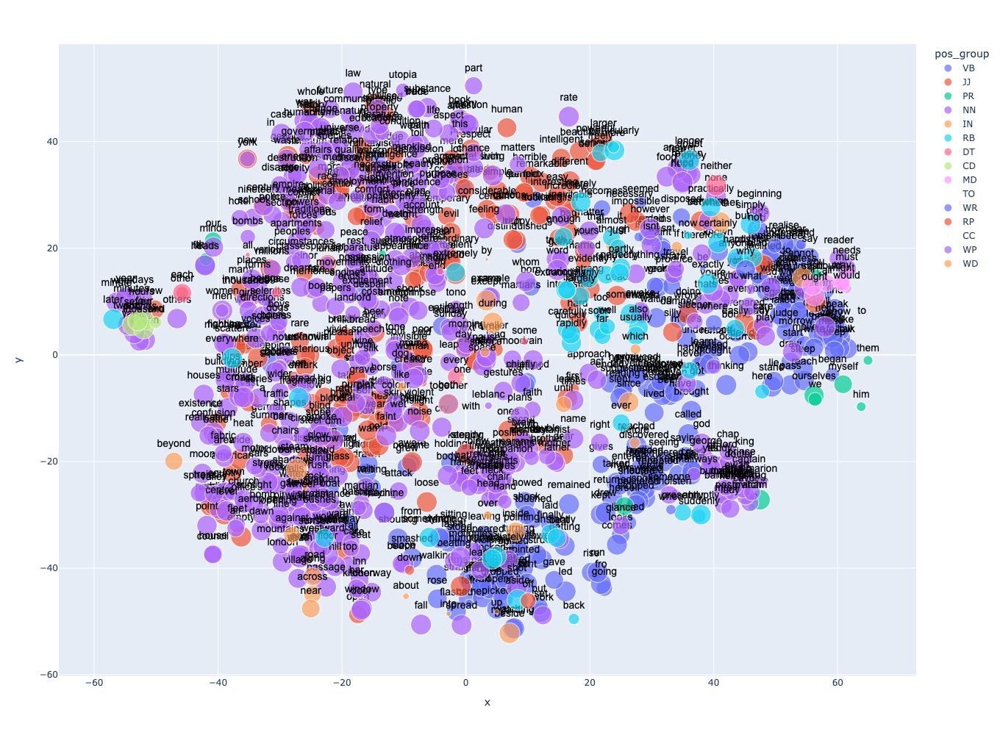

In [42]:
px.scatter(WellsCOORDS.reset_index().sample(1000), 
           'x', 'y', 
           text='term_str', 
           color='pos_group', 
           hover_name='term_str',          
           size='dfidf',           
           height=1000, width=1200).update_traces(
                mode='markers+text', 
                textfont=dict(color='black', size=14, family='Arial'),
                textposition='top center')

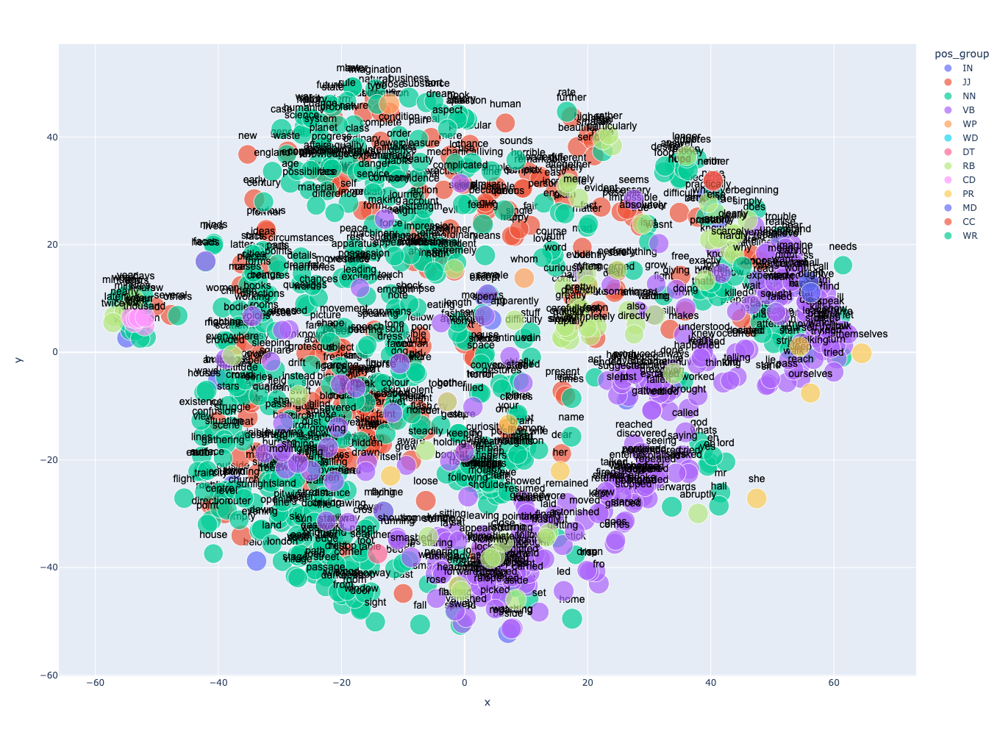

In [43]:
px.scatter(WellsCOORDS.reset_index().sort_values('dfidf', ascending=False).head(1000), 
           'x', 'y', 
           text='term_str', 
           color='pos_group', 
           hover_name='term_str',          
           size='dfidf',           
           height=1000, width=1200).update_traces(
                mode='markers+text', 
                textfont=dict(color='black', size=14, family='Arial'),
                textposition='top center')

In [44]:
tsne_engine = TSNE(**tsne_params)
Verne_tsne_model = tsne_engine.fit_transform(VerneW2V)

In [45]:
VerneCOORDS = pd.DataFrame(Verne_tsne_model, columns=['x','y'], index=VerneW2V.index)\
    .join(VerneVOCAB, how='left')[['x','y','n','dfidf','pos_group']]

In [46]:
VerneCOORDS = VerneCOORDS[VerneCOORDS.dfidf.notnull()]

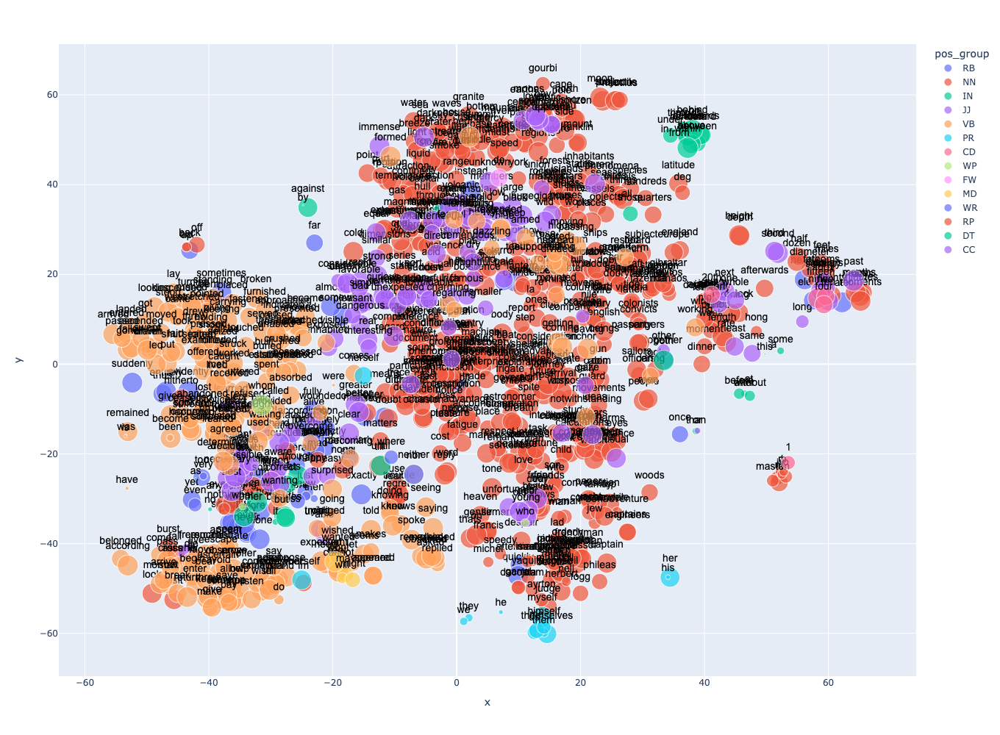

In [47]:
px.scatter(VerneCOORDS.reset_index().sample(1000), 
           'x', 'y', 
           text='term_str', 
           color='pos_group', 
           hover_name='term_str',          
           size='dfidf',           
           height=1000, width=1200).update_traces(
                mode='markers+text', 
                textfont=dict(color='black', size=14, family='Arial'),
                textposition='top center')

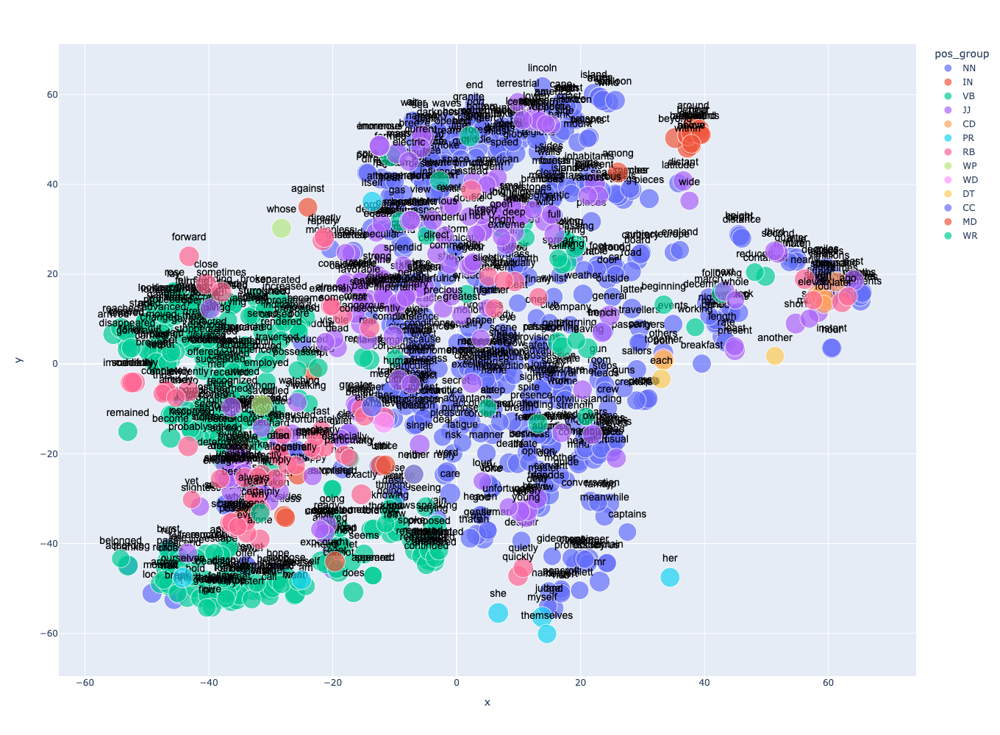

In [48]:
px.scatter(VerneCOORDS.reset_index().sort_values('dfidf', ascending=False).head(1000), 
           'x', 'y', 
           text='term_str', 
           color='pos_group', 
           hover_name='term_str',          
           size='dfidf',           
           height=1000, width=1200).update_traces(
                mode='markers+text', 
                textfont=dict(color='black', size=14, family='Arial'),
                textposition='top center')

# Semantic Algebra

## Analogies

$A : B :: C : D? \rightarrow B - A + C = D$


In [49]:
def complete_analogy_Wells(A, B, C, n=2):
    try:
        cols = ['term', 'sim']
        return pd.DataFrame(WellsModel.wv.most_similar(positive=[B, C], negative=[A])[0:n], columns=cols)
    except KeyError as e:
        print('Error:', e)
        return None
    
def get_most_similar_Wells(positive, negative=None):
    return pd.DataFrame(WellsModel.wv.most_similar(positive, negative), columns=['term', 'sim'])

In [50]:
def complete_analogy_Verne(A, B, C, n=2):
    try:
        cols = ['term', 'sim']
        return pd.DataFrame(VerneModel.wv.most_similar(positive=[B, C], negative=[A])[0:n], columns=cols)
    except KeyError as e:
        print('Error:', e)
        return None
    
def get_most_similar_Verne(positive, negative=None):
    return pd.DataFrame(VerneModel.wv.most_similar(positive, negative), columns=['term', 'sim'])

In [51]:
complete_analogy_Verne('earth', 'moon', 'father', 3)

,term,sim
0,master,0.835448
1,friend,0.826393
2,friends,0.806784


In [52]:
complete_analogy_Wells('earth', 'moon', 'father', 3)

,term,sim
0,astonishment,0.726440
1,throat,0.722784
2,beatrice,0.702574


In [53]:
get_most_similar_Wells('moon')

,term,sim
0,surface,0.758718
1,future,0.707988
2,park,0.691614
3,valley,0.688609
4,sea,0.688438
5,floor,0.679362
6,empire,0.669696
7,town,0.663254
8,earth,0.662520
9,city,0.659130


In [54]:
get_most_similar_Verne('moon')

,term,sim
0,earth,0.870046
1,sun,0.829286
2,projectile,0.806791
3,island,0.745362
4,gallia,0.738433
5,coast,0.736200
6,balloon,0.734513
7,nautilus,0.729165
8,wind,0.723351
9,brig,0.715387


In [55]:
get_most_similar_Verne('excitement')

,term,sim
0,terror,0.895917
1,profound,0.889770
2,lantern,0.878342
3,machine,0.878301
4,frightful,0.873112
5,watching,0.872759
6,step,0.868993
7,steel,0.859539
8,astonishment,0.859470
9,silence,0.854333


In [56]:
get_most_similar_Wells('excitement')

,term,sim
0,french,0.848588
1,despair,0.841419
2,ends,0.829370
3,youth,0.817218
4,satisfaction,0.816940
5,skin,0.812824
6,golden,0.807348
7,appearance,0.805721
8,conflict,0.804172
9,costume,0.801453


In [57]:
get_most_similar_Wells('earth')

,term,sim
0,moon,0.662520
1,surface,0.609672
2,on,0.602993
3,goes,0.584999
4,lines,0.561645
5,ground,0.524176
6,master,0.523429
7,beach,0.512529
8,sunday,0.510506
9,either,0.506612


In [58]:
get_most_similar_Verne('earth')

,term,sim
0,moon,0.870045
1,sun,0.835330
2,coast,0.808543
3,surface,0.786873
4,interior,0.782710
5,lunar,0.769401
6,atmosphere,0.756925
7,globe,0.756267
8,projectile,0.754004
9,centre,0.750729


In [59]:
get_most_similar_Verne('island')

,term,sim
0,moon,0.745362
1,earth,0.743286
2,coast,0.716808
3,atmosphere,0.716337
4,unknown,0.689413
5,lincoln,0.689118
6,islet,0.668489
7,point,0.666368
8,gallia,0.651432
9,globe,0.639812


In [60]:
get_most_similar_Wells('island')

,term,sim
0,gas,0.799369
1,roof,0.779517
2,surface,0.778212
3,park,0.763562
4,sand,0.754122
5,central,0.752405
6,floor,0.750457
7,lake,0.749091
8,gigantic,0.744805
9,realisation,0.732983


In [61]:
get_most_similar_Wells('journey')

,term,sim
0,adventure,0.837190
1,intercourse,0.818423
2,proper,0.777785
3,terrestrial,0.771777
4,train,0.760763
5,nights,0.753604
6,empire,0.750254
7,immediate,0.748603
8,logic,0.738324
9,national,0.737358


In [62]:
get_most_similar_Verne('journey')

,term,sim
0,trip,0.857480
1,voyage,0.854831
2,search,0.833270
3,arrival,0.829145
4,prison,0.828294
5,departure,0.818602
6,flight,0.811808
7,satellite,0.803547
8,yard,0.803478
9,route,0.803436


# Save

In [63]:
WellsW2V.to_csv(f'{data_home}/output/WELLS-W2V.csv')
VerneW2V.to_csv(f'{data_home}/output/VERNE-W2V.csv')
WellsVOCAB.to_csv(f'{data_home}/output/WELLS-VOCAB.csv')
VerneVOCAB.to_csv(f'{data_home}/output/VERNE-VOCAB.csv')
WellsSENTS.to_csv(f'{data_home}/output/WELLS-GENSIM_DOCS.csv')
VerneSENTS.to_csv(f'{data_home}/output/VERNE-GENSIM_DOCS.csv')